In [1]:
from PORTAL import DualGuidePORTAL
from PORTAL_viz import (
    plot_split_symmetric_matrix, 
    create_complex_interaction_matrix_from_sig_df,
    plot_complex_heatmap,
    plot_two_interactions_comparison, 
    plot_separate_model_query,
    plot_cluster_correlations,
    plot_reporter_single_effects
)
from scipy.stats import pearsonr
from cluster_recall import recall_and_process_multiple_gene_sets_jointly
from umap_viz import calculate_cluster_centers_density, add_complex_edges_curved, add_complex_network_legend
import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import MultipleLocator
from adjustText import adjust_text
import textwrap

In [2]:
import mkl

# Force MKL to use exactly 12 threads
mkl.set_num_threads(12)

# Verify it worked
print(f"Current MKL threads: {mkl.get_max_threads()}")

Current MKL threads: 12


In [3]:
cdict = {'red':((0.0,0.125,0.125),
                (0.5,0.0,0.0),
                (1.0,0.957,0.957)),
        'green':((0.0,0.713,0.713),
                (0.5,0.0,0.0),
                (1.0,0.918,0.918)),
        'blue': ((0.0,0.886,0.886),
                (0.5,0.0,0.0),
                (1.0,0.094,0.094))}
blue_yellow = LinearSegmentedColormap('BlueYellow',cdict)
blue_yellow.set_bad((.9, .9, .9, 1.0))
matplotlib.colormaps.register(cmap=blue_yellow)

In [4]:
sns.set_context('paper')
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.sans-serif"] = ["Arial"]
plt.rcParams['legend.fontsize'] = 12
plt.rcParams['legend.title_fontsize'] = 14

In [5]:
umi_filepath = "/data1/normantm/angel/Pscreen_data/K562_AP1_816_puro/all_combined_UMI_counts.csv"
viral_rep_filepath = "/data1/normantm/angel/Pscreen_data/K562_AP1_816_puro/viral_representations.csv"
k562_library_path = "/home/tanga1/Pscreen/20240329_pScreen_complex_experiment.csv"
embedding_coordinates_path = "/home/tanga1/Pscreen/annotated_embedding_coordinates.csv"

In [6]:
puro_AP1_screen = DualGuidePORTAL.from_csv(umi_filepath,
                                            input_rep_data=viral_rep_filepath,
                                            sample_columns=["sample", "rep"])
puro_AP1_screen.run_standard_analysis()

Generated guide IDs: 613 genes with 816 guides
Step 1/12: Filtering overrepresented lineages...
Applied thresholds: repr1=0.1207, repr2=0.1322
Step 2/12: Setting controls...
Step 3/12: Log transforming UMIs...
Step 4/12: Formatting sample columns...
Step 5/12: Regressing reporter...
Coefficients: [[ 6.52559279e-01  2.17873756e+11  1.46350045e+11  1.29243731e+11
  -5.04564730e+10 -5.04564730e+10 -5.04564730e+10  2.10672381e+10
   2.10672381e+10  2.10672381e+10  3.81735519e+10  3.81735519e+10
   3.81735519e+10]]
Intercept: [-1.67417283e+11]
R^2 score: 0.48400153848738114
Step 6/12: Regressing identity (Poisson)...
Step 7/12: Calculating summary statistics...
Step 8/12: Calculating activity matrices...
Step 9/12: Skipping PCP decomposition...
Step 10/12: Saving guide activities...
PCP activities not calculated
'DualGuidePORTAL' object has no attribute 'reporter_pcp_results'
Step 11/12: Calculating genetic interactions...
PCP interactions not calculated
Step 12/12: Clustering genetic inter

### guide representation

In [7]:
all_lineages = puro_AP1_screen.filtered_umi_df[['p1_identity', 'p2_identity', 'barcode_mapped', 'rep']].drop_duplicates()

In [8]:
lineages_per_pair = all_lineages[["p1_identity", "p2_identity"]].value_counts()

Text(0.5, 8.844444444444465, 'lineages per sgRNA pair')

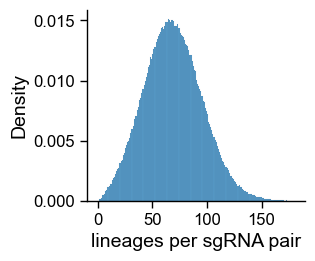

In [9]:
sns.displot(lineages_per_pair, stat="density",
            binwidth=1, height=2.7, aspect=1.2)
plt.xlim(-10, 190)
plt.xlabel("lineages per sgRNA pair")
# plt.savefig("lineages_sgRNA_pair_distribution.svg", bbox_inches='tight', transparent=True, pad_inches=0.1)

In [10]:
# import pickle
# with open('/data1/normantm/angel/Pscreen_data/K562_AP1_816_puro/puro_AP1_screen_Final.pkl', 'wb') as f:
#    pickle.dump(puro_AP1_screen, f)

### Correlation between reciprocal pairs

In [11]:
def plot_reciprocal_pairs(df, control_prefix="non",
                          colors=["#020101", "#c16e71", "#faf0f0"],
                          lim=(-16, 9), name="reporter"):
    mask = np.triu(np.ones(df.shape, dtype=bool), k=1)
    row_idx, col_idx = np.where(mask)
    
    x_vals = df.values[mask]
    y_vals = df.T.values[mask]
    
    guide1 = df.index[row_idx].to_numpy()
    guide2 = df.columns[col_idx].to_numpy()
    
    is_control1 = np.array([g.startswith(control_prefix) for g in guide1])
    is_control2 = np.array([g.startswith(control_prefix) for g in guide2])
    
    control_control = is_control1 & is_control2
    guide_control = (is_control1 & ~is_control2) | (~is_control1 & is_control2)
    guide_guide = ~is_control1 & ~is_control2
    
    valid = ~(np.isnan(x_vals) | np.isnan(y_vals))

    r, p = pearsonr(x_vals[valid], y_vals[valid])
    
    fig = plt.figure(figsize=(4, 4))
    plt.scatter(x_vals[valid & guide_guide], y_vals[valid & guide_guide], linewidth=0,
                alpha=0.6, s=8, label='guide, guide', c=colors[0])
    plt.scatter(x_vals[valid & guide_control], y_vals[valid & guide_control], linewidth=0,
                alpha=0.6, s=8, label='guide, control', c=colors[1])
    plt.scatter(x_vals[valid & control_control], y_vals[valid & control_control], linewidth=0,
                alpha=0.6, s=8, label='control, control', c=colors[2])

    plt.gca().xaxis.set_major_locator(MultipleLocator(5))
    plt.gca().yaxis.set_major_locator(MultipleLocator(5))

    plt.text(0.1, 0.95, f'r = {r:.2f}', transform=plt.gca().transAxes, 
         fontsize=12, va='top')
    
    plt.xlabel(f"{name} phenotype (p1p2)")
    plt.ylabel(f"{name} phenotype (p2p1)")
    plt.axis('equal')
    plt.xlim(lim)
    plt.ylim(lim)
    plt.legend(frameon=False)
    plt.tight_layout()
    sns.despine()

    return fig

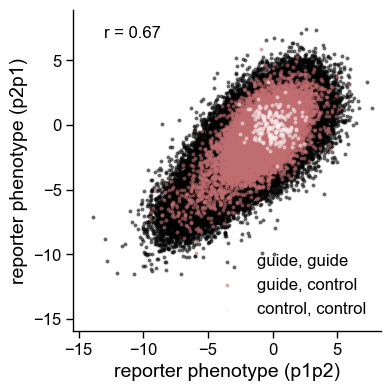

In [12]:
fig = plot_reciprocal_pairs(puro_AP1_screen.reporter_activity)

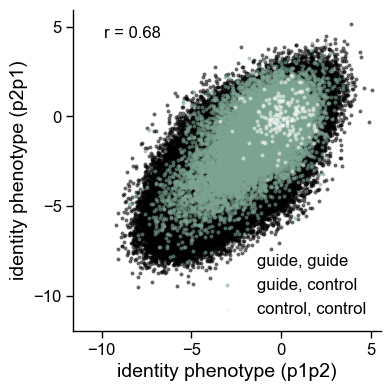

In [13]:
fig = plot_reciprocal_pairs(puro_AP1_screen.identity_activity,
                            colors=["#010101", "#7da493", "#f2f6f4"],
                            lim=(-12, 6), name="identity"
                           )

### Data processing visualizations

#### reporter

Text(55.95031565656568, 0.5, 'Reporter UMI counts')

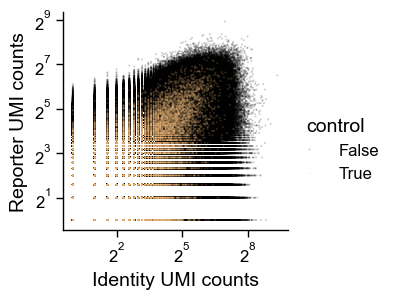

In [14]:
fig = sns.relplot(puro_AP1_screen.filtered_umi_df.sort_values("control"), x="UMI_identity", y="UMI_reporter", hue="control",
            palette=['#010101', '#EAB679'],
            s=2, linewidth=0, alpha=0.2, height=3, aspect=1.1, rasterized=True)
plt.xscale("log", base=2)
plt.yscale("log", base=2)
plt.xlabel("Identity UMI counts")
plt.ylabel("Reporter UMI counts")

Text(55.37045138888887, 0.5, 'Reporter residuals')

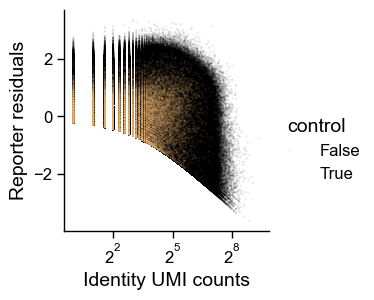

In [15]:
fig = sns.relplot(puro_AP1_screen.filtered_umi_df.sort_values("control"), x="UMI_identity", y="reporter_resid", hue="control",
            palette=['#010101', '#EAB679'],
            s=2, linewidth=0, alpha=0.1, height=3, rasterized=True)
plt.xscale("log", base=2)
plt.xlabel("Identity UMI counts")
plt.ylabel("Reporter residuals")

Text(56.1027777777778, 0.5, 'Mean reporter residuals')

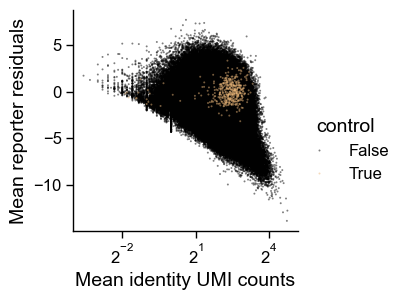

In [16]:
guide_pairs = puro_AP1_screen.filtered_umi_df.groupby(
    ["p1_identity", "p2_identity", "control"]
)[["UMI_identity", "reporter_resid"]].mean().sort_values("control")
guide_pairs["z_mean_resid"] = (
                guide_pairs["reporter_resid"] - guide_pairs.query("control")["reporter_resid"].mean()
            ) / guide_pairs.query("control")["reporter_resid"].std()

fig = sns.relplot(guide_pairs,
                  x="UMI_identity", y="z_mean_resid", hue="control",
                  palette=['#010101', '#EAB679'],
                  s=2, linewidth=0, alpha=0.5, height=3, aspect=1.1, rasterized=True)
plt.xscale("log", base=2)
plt.xlabel("Mean identity UMI counts")
plt.ylabel("Mean reporter residuals")
# fig.savefig("puro_screen_mean_reporter_residual_identity_scatterplot.svg", bbox_inches="tight")

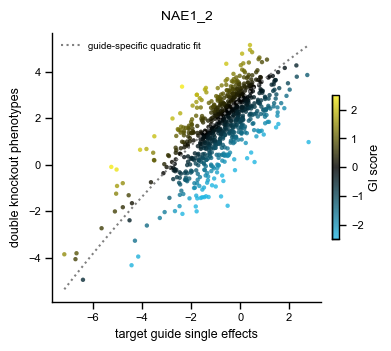

In [17]:
fig = plot_separate_model_query(
    "NAE1_GTGGTGGCGGCGCTCCGCAG",
    puro_AP1_screen,
    figsize=(4,4),
    s=10,
    cmap="BlueYellow",
    annotate_outliers=False,
    outlier_threshold=1.2
)
# fig.savefig("example_per_gene_fit.svg", bbox_inches="tight")

#### identity

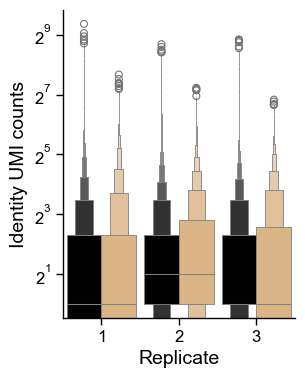

In [18]:
fig, ax = plt.subplots(figsize=(3,4))
sns.boxenplot(data=puro_AP1_screen.filtered_umi_df, y="UMI_identity", x="rep", hue="control", palette=['#010101', '#EAB679'], linecolor="grey", 
              width=0.9, rasterized=True, legend=False,
              ax=ax)
plt.yscale("log", base=2)
ax.set_ylabel("Identity UMI counts")
ax.set_xlabel("Replicate")
sns.despine()
# fig.savefig("puro_screen_identity_UMI.svg", bbox_inches="tight")

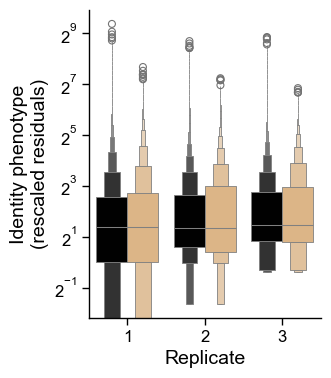

In [19]:
fig, ax= plt.subplots(figsize=(3,4))
sns.boxenplot(data=puro_AP1_screen.filtered_umi_df, y="identity_resid_rescaled",
              x="rep", hue="control", palette=['#010101', '#EAB679'], linecolor="grey", width=0.8, 
              rasterized=True, legend=False,
              ax=ax)
plt.yscale("log", base=2)
ax.set_ylabel("Identity phenotype\n(rescaled residuals)")
ax.set_xlabel("Replicate")
sns.despine()
# fig.savefig("puro_screen_identity_residuals.svg", bbox_inches="tight")

Text(69.10664930555554, 0.5, 'Identity representation')

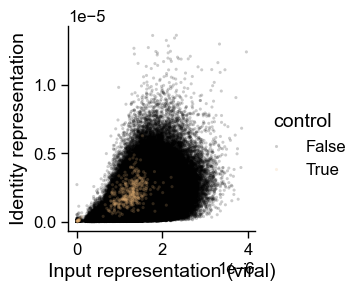

In [20]:
fig = sns.relplot(puro_AP1_screen.summary_df.sort_values("control"),
                  x="viral_repr", y="identity_screen_rep", hue="control",
                  palette=['#010101', '#EAB679'],
                  s=5, linewidth=0, alpha=0.2, height=3, rasterized=True)
plt.xlabel("Input representation (viral)")
plt.ylabel("Identity representation")

# fig.savefig("puro_identity_vs_input_repr.svg", bbox_inches="tight")

Text(58.47305555555555, 0.5, 'Identity phenotype\n(log2FC depletion)')

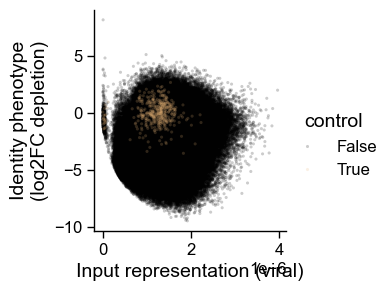

In [21]:
fig = sns.relplot(puro_AP1_screen.summary_df.sort_values("control"),
                  x="viral_repr", y="identity_z", hue="control",
            palette=['#010101', '#EAB679'],
            s=5, linewidth=0, alpha=0.2, height=3, rasterized=True)
plt.xlabel("Input representation (viral)")
plt.ylabel("Identity phenotype\n(log2FC depletion)")
# fig.savefig("puro_log2fc_depletion.svg", bbox_inches="tight")

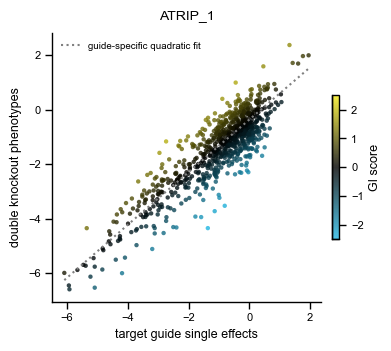

In [22]:
fig = plot_separate_model_query(
    "ATRIP_GCACTCGCGGCGGAGGCAAG",
    puro_AP1_screen,
    figsize=(4,4),
    s=10,
    cmap="BlueYellow",
    annotate_outliers=False,
    outlier_threshold=1.2,
    use_identity=True
)
# fig.savefig("example_per_gene_fit_identity.svg", bbox_inches="tight")

### Recall of complexes/clusters and visualization

In [23]:
k562_lib = pd.read_csv(k562_library_path, index_col=0)
k562_lib.index.name = "target_gene"

k562_lib = (
    k562_lib.reset_index()
    .melt(
        id_vars=["target_gene", "reason chosen", "complex member", "guide_count"],
        value_vars=['protospacer_A', 'protospacer_B'], 
        var_name="guide", 
        value_name="protospacer"
    )
    .dropna(subset=["protospacer"])
    .set_index("target_gene")
)

all_genes = k562_lib.query("~target_gene.str.startswith('non-targeting')").index.values
transcriptional_prefixes = ('Transcriptional cluster', 'Manual examples from')

def extract_gene_sets(lib, column, delimiter, filter_func=None, clean_func=None):
    gene_dict = {}
    deduped = lib[~lib.index.duplicated()]
    
    for gene in lib[column].dropna().index:
        clusters = deduped.loc[gene][column].split(delimiter)
        for cluster in clusters:
            if filter_func and filter_func(cluster):
                continue
            cluster_clean = clean_func(cluster) if clean_func else cluster
            if cluster_clean not in gene_dict:
                gene_dict[cluster_clean] = []
            gene_dict[cluster_clean].append(gene)
    
    return {k: np.unique(v) for k, v in gene_dict.items()}

# Build complexes
complex_gene = extract_gene_sets(k562_lib, "complex member", " | ")
complex_gene = {k: v for k, v in complex_gene.items() if len(v) > 1}
complex_gene = dict(sorted(complex_gene.items(), key=lambda x: (len(x[1]), x[0])))

# Build transcriptional clusters
transcriptional_clusters_gene = extract_gene_sets(
    k562_lib.query("`reason chosen`.str.startswith(@transcriptional_prefixes)"),
    "reason chosen",
    "|",
    filter_func=lambda c: c.strip() == "CORUM complex with transcriptional phenotype",
    clean_func=lambda c: c.lstrip('Manual examples from ').capitalize().strip()
)

gene_sets = {
    'Transcriptional': transcriptional_clusters_gene,
    'Complexes': complex_gene
}

In [24]:
sym_gi_raw_results = recall_and_process_multiple_gene_sets_jointly(
    data_matrix=puro_AP1_screen.z_reporter_GI,
    hierarchical_order=puro_AP1_screen.reporter_order,
    gene_sets_dict=gene_sets,
    window_size=10,
    n_permutations=1000,
    expand_with_neighbors=True,
    p_value_threshold=0.05,
    min_cluster_size=2,
    use_fdr=True,
    random_seed=0
)

Running recall for all gene sets...
  Processing gene set: Transcriptional
  Processing gene set: Complexes

Performing joint FDR correction across all gene sets...
  Found 1157 significant gene-cluster pairs (FDR < 0.05)
  Across 247 unique genes

Expanding significant genes with neighbors...
  After expansion: 1234 total gene-cluster pairs

Performing joint gene assignment with distance checking...
  Assigned 328 (gene, position) pairs to clusters

Removing orphaned neighbors...
  Removed 4 orphaned neighbors

Combined results:
  Total: 319 genes in 55 clusters


In [25]:
manual_annotations_path = "/home/tanga1/Pscreen/Pscreen_paper/reporter_manual_annotations.csv"
manual_annotations = pd.read_csv(manual_annotations_path)

In [26]:
combined_clusters = pd.concat([sym_gi_raw_results['filtered'].sort_values("position"), manual_annotations],
          ignore_index=True)

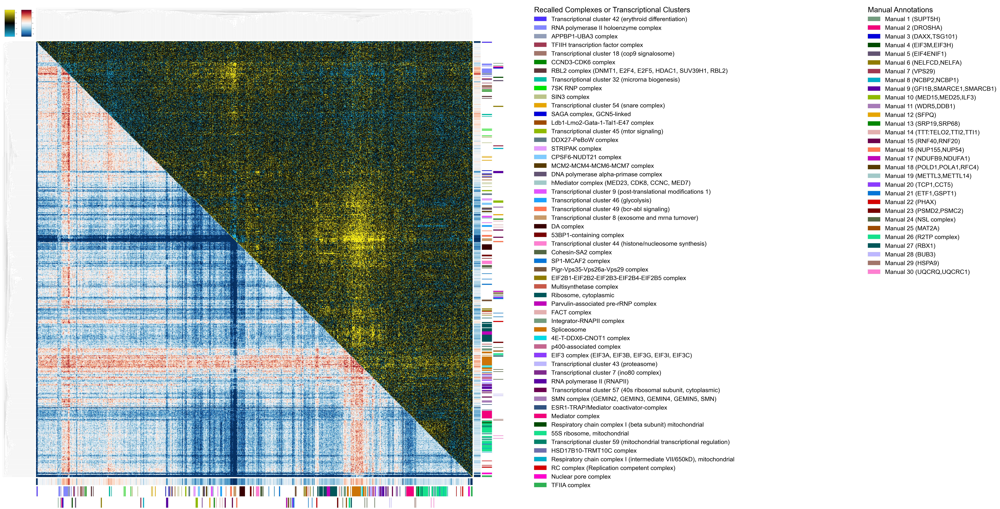

In [27]:
fig, axes, cluster_colors = plot_split_symmetric_matrix(
    upper_matrix=puro_AP1_screen.z_reporter_GI,        # GI scores
    lower_matrix=puro_AP1_screen.reporter_avg_guide_matrix / np.nanstd(puro_AP1_screen.reporter_avg_guide_matrix), # Expression
    linkage_matrix=puro_AP1_screen.reporter_Z,
    sig_genes_df_list=[sym_gi_raw_results['filtered'], manual_annotations],
    color_palette='glasbey_bw_minc_20_maxl_70',
    annotation_labels=['Recalled Complexes or Transcriptional Clusters', 'Manual Annotations'], 
    phenotype=puro_AP1_screen.reporter_single_effects / np.nanstd(puro_AP1_screen.reporter_avg_guide_matrix),
    upper_cmap='BlueYellow',
    lower_cmap='RdBu_r',
    phenotype_cmap='RdBu_r',
    upper_vmin=-2.5,
    upper_vmax=2.5,
    lower_vmin=-2.5,
    lower_vmax=2.5,
    phenotype_vmin=-2.5,
    phenotype_vmax=2.5,
    # show_labels=True,
    dendrogram_ratio=0.05,
    dendrogram_linewidth=0.1,
    figsize=(50, 50)
)

In [28]:
# fig.savefig("annotated_GI_expr_heatmaps_per_gene_sym_raw_include_manual.svg", bbox_inches="tight")

In [29]:
sym_gi_id_raw_results = recall_and_process_multiple_gene_sets_jointly(
    data_matrix=puro_AP1_screen.z_identity_GI,
    hierarchical_order=puro_AP1_screen.identity_order,
    gene_sets_dict=gene_sets,
    window_size=10,
    n_permutations=1000,
    expand_with_neighbors=True,
    p_value_threshold=0.05,
    min_cluster_size=2,
    use_fdr=True,
    random_seed=0
)

Running recall for all gene sets...
  Processing gene set: Transcriptional
  Processing gene set: Complexes

Performing joint FDR correction across all gene sets...
  Found 506 significant gene-cluster pairs (FDR < 0.05)
  Across 127 unique genes

Expanding significant genes with neighbors...
  After expansion: 580 total gene-cluster pairs

Performing joint gene assignment with distance checking...
  Assigned 162 (gene, position) pairs to clusters

Removing orphaned neighbors...
  Removed 4 orphaned neighbors

Combined results:
  Total: 156 genes in 33 clusters


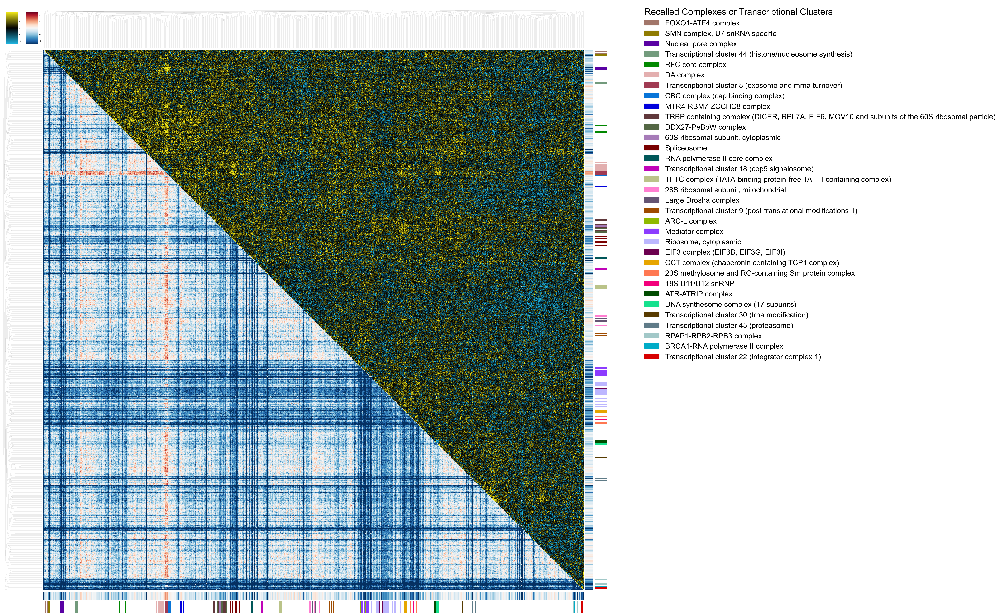

In [30]:
fig, axes, cluster_colors = plot_split_symmetric_matrix(
    upper_matrix=puro_AP1_screen.z_identity_GI,        # GI scores
    lower_matrix=puro_AP1_screen.identity_avg_guide_matrix / np.nanstd(puro_AP1_screen.identity_avg_guide_matrix), # Expression
    linkage_matrix=puro_AP1_screen.identity_Z,
    sig_genes_df_list=[sym_gi_id_raw_results['filtered']],
    color_palette='glasbey_bw_minc_20_maxl_70',
    annotation_labels=['Recalled Complexes or Transcriptional Clusters'], 
    phenotype=puro_AP1_screen.identity_single_effects / np.nanstd(puro_AP1_screen.identity_avg_guide_matrix),
    upper_cmap='BlueYellow',
    lower_cmap='RdBu_r',
    phenotype_cmap='RdBu_r',
    upper_vmin=-2.5,
    upper_vmax=2.5,
    lower_vmin=-2.5,
    lower_vmax=2.5,
    phenotype_vmin=-2.5,
    phenotype_vmax=2.5,
    # show_labels=True,
    dendrogram_ratio=0.05,
    dendrogram_linewidth=0.1,
    figsize=(50, 50)
)

In [31]:
# fig.savefig("annotated_identity_GI_expr_heatmaps_per_gene_sym_raw.svg", bbox_inches="tight")

### Cluster-level reporter GI map

In [32]:
reporter_cluster_matrix = create_complex_interaction_matrix_from_sig_df(puro_AP1_screen.z_reporter_GI,
                                                                        combined_clusters)
reporter_cluster_matrix_recalled = create_complex_interaction_matrix_from_sig_df(puro_AP1_screen.z_reporter_GI,
                                                                        sym_gi_raw_results['filtered'])


Created 85x85 complex interaction matrix

Created 55x55 complex interaction matrix


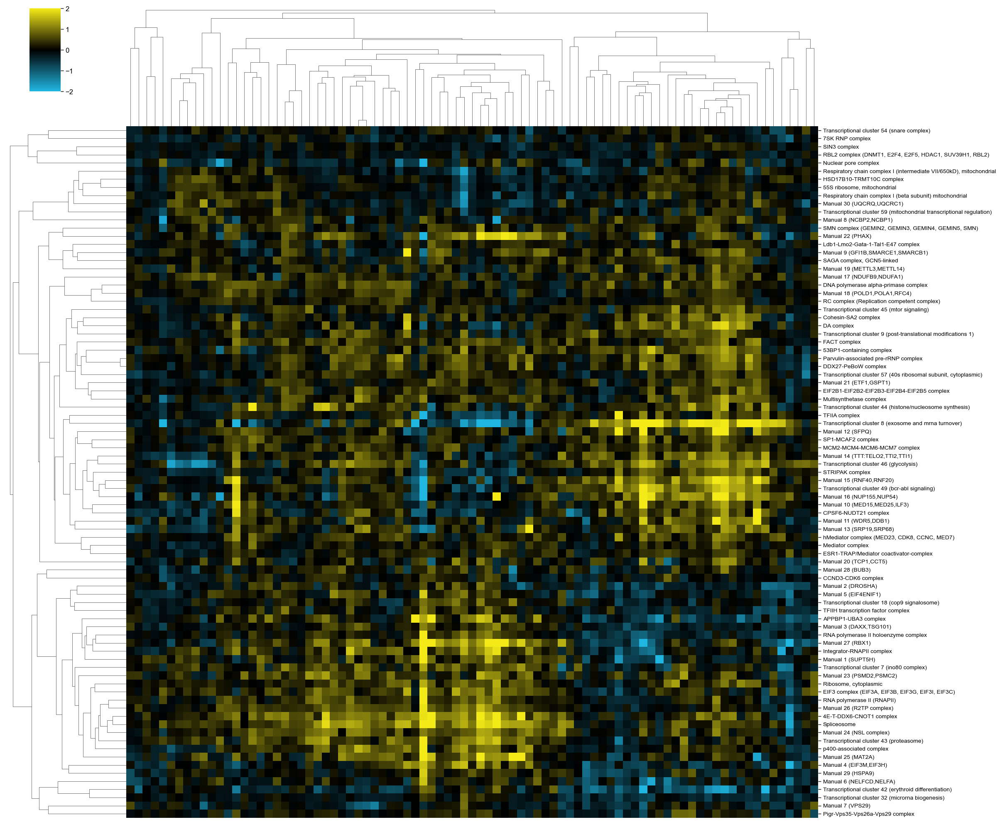

In [33]:
fig = plot_complex_heatmap(reporter_cluster_matrix, cmap="BlueYellow", figsize=(25,25), color_scale=2)
# fig.savefig("reporter_cluster_interactions.svg", bbox_inches="tight")

### Visualization on embedding

In [34]:
annotated_embedding_coordinates = pd.read_csv(embedding_coordinates_path)

In [35]:
single_reporter_phen = puro_AP1_screen.reporter_single_effects.to_frame("reporter_phen")
single_reporter_phen["gene"] = single_reporter_phen.index.str.split("_").str[0]
merged_coordinates_df = annotated_embedding_coordinates.merge(
    single_reporter_phen.groupby("gene").mean(), 
    left_on="gene", right_index=True)

In [36]:
cluster_significant = sym_gi_raw_results['significant'][
    sym_gi_raw_results['significant']['cluster_reassigned'].isin(reporter_cluster_matrix_recalled.index)
]
cluster_centers_weighted = calculate_cluster_centers_density(
    umap_df=merged_coordinates_df.set_index("gene")[["x", "y"]],
    significant_df=pd.concat([cluster_significant,  manual_annotations]),
    x_col='x',
    y_col='y'
)

Collapsed 1295 guide-cluster pairs to 322 unique gene-cluster pairs

Calculated centers for 83 clusters
Total genes with valid coordinates: 281


/tmp/ipykernel_1113187/2823157893.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('RdBu_r')
Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


Edges above threshold: 38 positive, 35 negative
Using 545 background points (strength=0.2)

Drew 38 edges: 19 positive, 19 negative


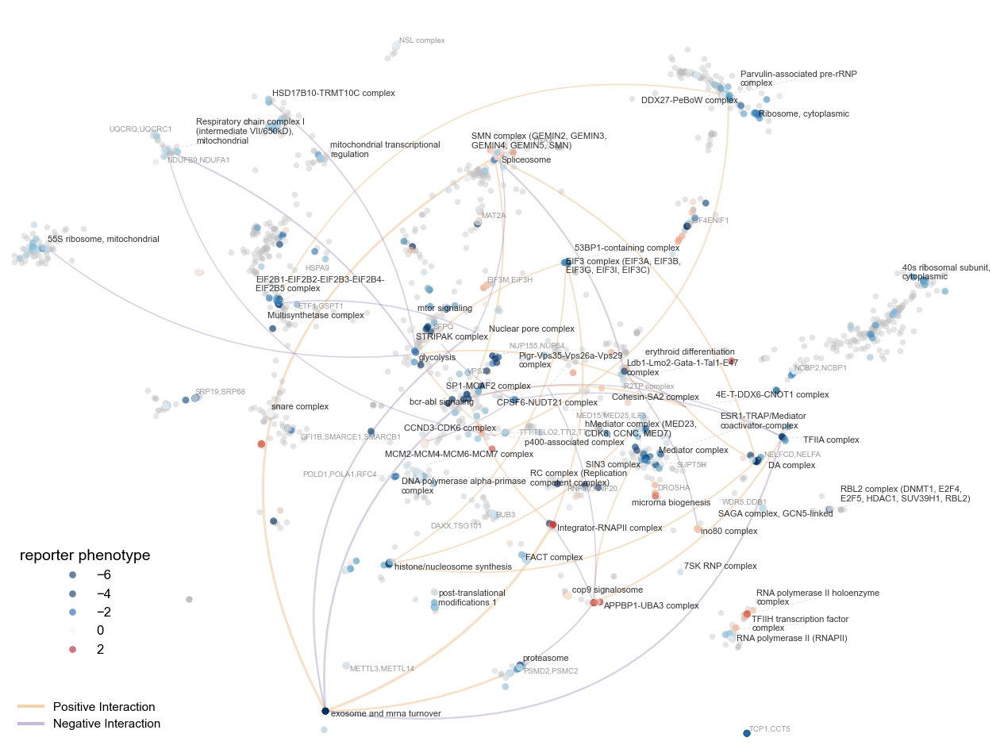

In [37]:
fig, ax = plt.subplots(figsize=(16,12))
norm = plt.Normalize(vmin=-2.5, vmax=2.5)
cmap = plt.cm.get_cmap('RdBu_r')

sns.scatterplot(data=annotated_embedding_coordinates, x="x", y="y", s=30, alpha=0.4, 
                linewidth=0, color="silver", ax=ax, zorder=3)
sns.scatterplot(data=merged_coordinates_df.sample(frac=1, random_state=1), x="x", y="y", s=40, alpha=0.6,
                linewidth=0, hue="reporter_phen", palette=cmap, hue_norm=norm, ax=ax, zorder=3)

texts = []
for i, row in cluster_centers_weighted.reset_index().iterrows():
    if row['cluster_name'].startswith("Transcriptional cluster"):
        label = re.search(r'\(([^)]+)\)', row['cluster_name']).group(1)
    else:
        label = row['cluster_name']
    wrapped_text = textwrap.fill(label, width=30)
    if label.startswith("Manual"):
        label = re.search(r'\(([^)]+)\)', label).group(1)
        wrapped_text = textwrap.fill(label, width=30)
        texts.append(plt.text(row['emb_variable_x'], row['emb_variable_y'], wrapped_text,
                          fontsize=7, multialignment='left', color='grey', alpha=0.8, zorder=4))
    else:
        texts.append(plt.text(row['emb_variable_x'], row['emb_variable_y'], wrapped_text,
                          fontsize=8, multialignment='left', color='black', alpha=0.8, zorder=4))

adjust_text(texts, ax=ax, force_text=0.5, force_points=0,
            arrowprops=dict(arrowstyle="-", color='lightgrey', linestyle=(0, (4, 4)), lw=0.5))

sns.despine(left=True, bottom=True, right=True, top=True)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel("")
ax.set_ylabel("")
plt.xlim(-9.3, None)
plt.ylim(-8, None)

edges = add_complex_edges_curved(
    ax=ax,
    complex_matrix=reporter_cluster_matrix_recalled,
    positions_df=cluster_centers_weighted,
    threshold_positive=reporter_cluster_matrix_recalled.stack().quantile(0.975),  
    threshold_negative=abs(reporter_cluster_matrix_recalled.stack().quantile(0.025)),
    max_edges_per_node=3,
    width_scale=2,
    alpha=0.4,
    zorder=1,
    curvature=0.03,  
    node_avoidance_margin=1,
    background_points=merged_coordinates_df,
    background_x_col='x',
    background_y_col='y',
    background_avoidance_strength=0.2, 
)

network_legend = add_complex_network_legend(ax, loc='lower left', fontsize=11)
ax.add_artist(network_legend)

ax.legend(frameon=False, title="reporter phenotype",
          bbox_to_anchor=(0, 0.1), loc='lower left')


fig.canvas.draw()

plt.show()

In [38]:
# fig.savefig("umap_with_annotations_and_network_per_gene_sym_GI_raw_arc_top3_with_manual.svg", bbox_inches="tight")

### Examples

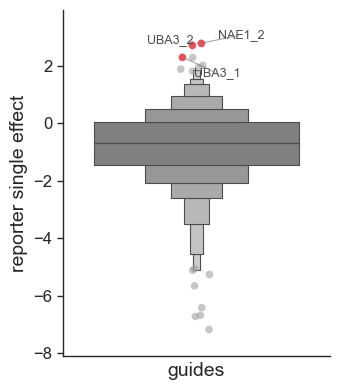

In [39]:
fig, ax = plot_reporter_single_effects(puro_AP1_screen, topn=3, figsize=(3.5,4))
# fig.savefig("NEDD_boxenplot.svg", bbox_inches="tight")

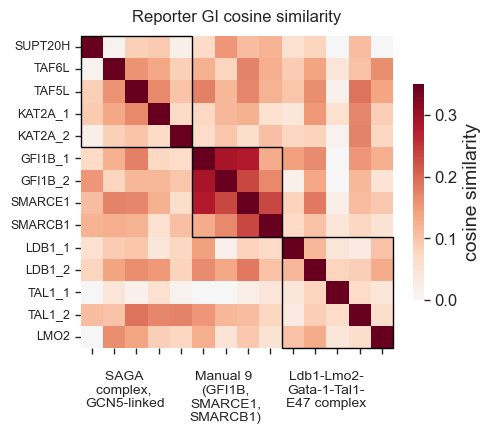

In [40]:
fig, corr_matrix = plot_cluster_correlations(
    screen=puro_AP1_screen,
    cluster=['SAGA complex, GCN5-linked', 'Manual 9 (GFI1B,SMARCE1,SMARCB1)', 'Ldb1-Lmo2-Gata-1-Tal1-E47 complex'],
    sig_df=combined_clusters,
    matrix_type='gi',
    mask_diagonal=False,
    similarity_metric="cosine",
    use_pcp=False, vmin=0, vmax=0.35, figsize=(5,5))
# fig.savefig("cosine_similarity_compare_GFI1B.svg", bbox_inches="tight")

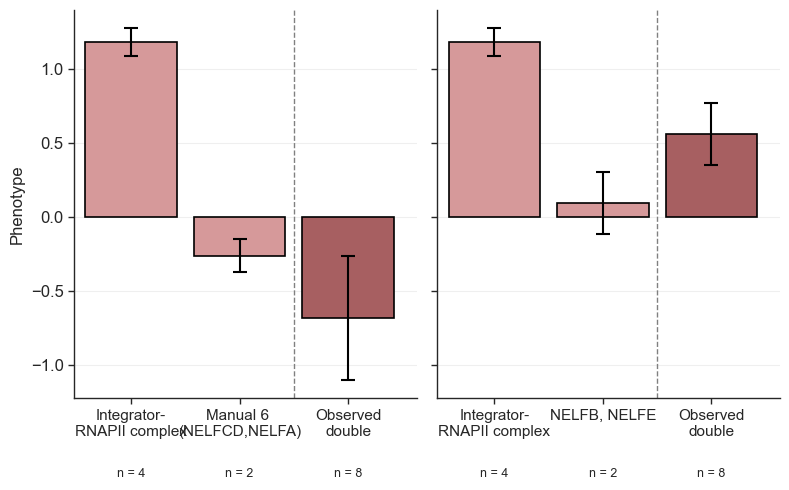

In [41]:
fig, axes = plot_two_interactions_comparison(
    screen=puro_AP1_screen,
    cluster1='Integrator-RNAPII complex',
    cluster2_left='Manual 6 (NELFCD,NELFA)',
    cluster2_right=['NELFB', 'NELFE'],
    sig_df=combined_clusters,
    use_pcp=False,
    figsize=(8,5),
    show_individual_guides=False
)